## Task 1.1

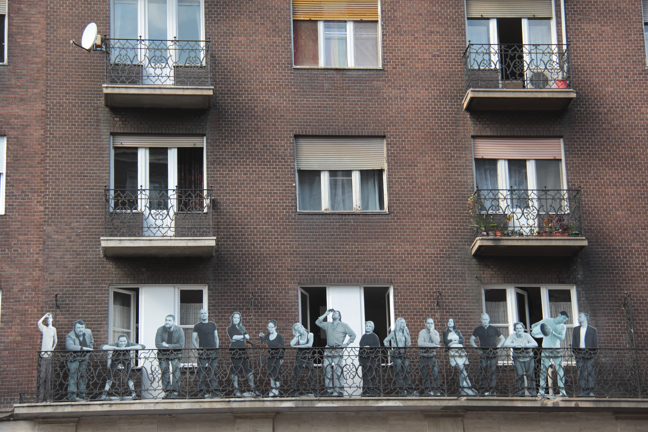

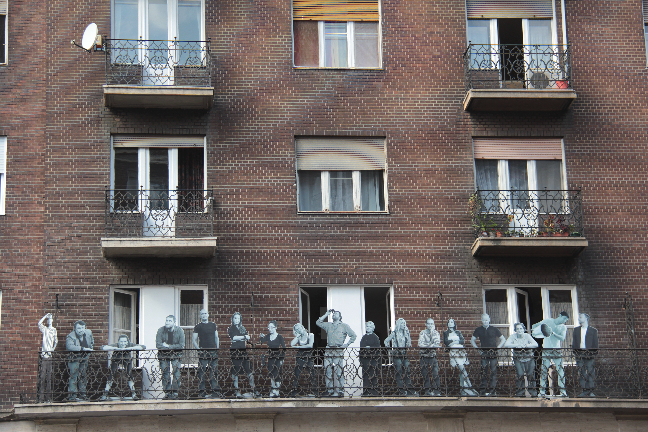

In [2]:
import numpy as np
from PIL import Image

factor = 8

with Image.open("media/IMG_5115.png") as image:
    display(image.resize((image.size[0] // factor, image.size[1] // factor)))
    original = np.array(image)
    mode = image.mode

downsampled = original[0::factor, 0::factor]
display(Image.fromarray(downsampled, mode))
# plt.subplots + imshow

The aliasing starts to become noticeable once we reach a factor of 4. The brick wall is given a wavy pattern.

At factor 5, it becomes impossible to not notice.

## Task 1.2

In [3]:
import soundfile as sf
from IPython.display import Audio

MAX_AMPL = 0x8000

# 2, 3, 6
factor = 6

original, sample_rate = sf.read("media/00252_4.9dB_PCM16.wav", dtype="int16")
print(sample_rate)
display(Audio(original / MAX_AMPL, rate=sample_rate, normalize=False))

downsampled = original[0::factor]
new_rate = sample_rate // factor
display(Audio(downsampled / MAX_AMPL, rate=new_rate, normalize=False))

sf.write(f"media/00252_4.9dB_PCM16_down{factor}.wav", downsampled, new_rate)

48000


Aliasing is most prominent with the _s_ and _sh_ phonemes. As the factor increases, it starts to be accompanied by more and more noise.

In [4]:
import scipy.signal

# low-pass filter
b, a = scipy.signal.butter(10, 1 / factor)
filtered = scipy.signal.lfilter(b, a, original)

# downsampling
downsampled = filtered[0::factor]
display(Audio(downsampled / MAX_AMPL, rate=new_rate, normalize=False))

# Task 2
16-bit ints can store numbers in the range $-32768$ to $+32767$, for a total of $65536$ values.

$\text{number of quantization steps} = 2^n$

In [5]:
def reduce_bitdepth(signal: np.ndarray, target_bitdepth: int) -> np.ndarray:
    """
    Diese Funktion nimmt ein numpy-Array mit Elementen eines Integertyps
    entgegen und reduziert die Wortbreite (engl. bitdepth) auf einen
    gewünschten Wert. Das Ausgabesignal soll aber denselben Datentyp
    verwenden wie das Eingabesignal und überflüssige Bitstellen mit
    Nullen auffüllen.
    :param signal: ein numpy-Array, welches Elemente eines Integertyps enthält
    :param target_bitdepth: die Anzahl an Bits, die für jedes Array-Element
        verwendet werden soll
    :returns: ein numpy-Array mit demselben Datentyp wie die Eingabe,
        aber reduzierter Anzahl an genutzten Bits
    """
    return np.left_shift(np.right_shift(signal, 16 - target_bitdepth), 16 - target_bitdepth)

display(Audio(original / MAX_AMPL, rate=sample_rate, normalize=False))
reduced = reduce_bitdepth(original, 13)
display(Audio(reduced / MAX_AMPL, rate=sample_rate, normalize=False))
noise = original - reduced

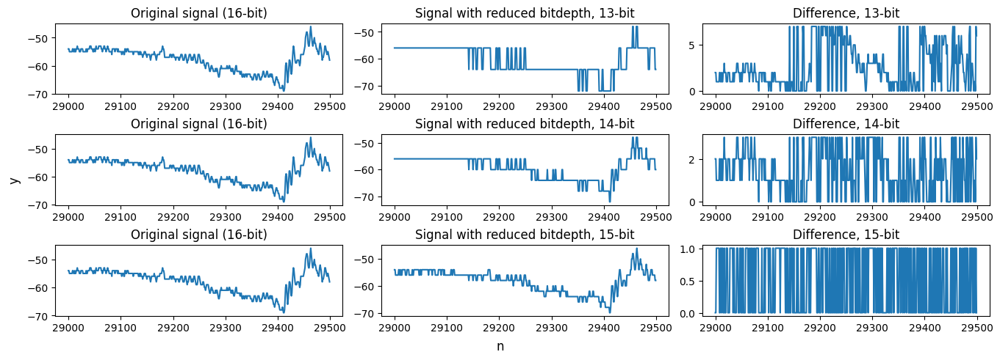

In [6]:
#%matplotlib widget
import matplotlib.pyplot as plt

start = 29000
size = 500
x_axis = np.arange(start, start + size)

fig, axs = plt.subplots(nrows=3, ncols=3, constrained_layout=True)
fig.set_figwidth(13.5)
fig.supxlabel("n")
fig.supylabel("y")

def plot_comparison(axs, reduced, title_add):
    noise = original - reduced
    axs[0].title.set_text("Original signal (16-bit)")
    axs[0].plot(x_axis, original[start:start + size])
    axs[1].title.set_text("Signal with reduced bitdepth, " + title_add)
    axs[1].plot(x_axis, reduced[start:start + size])
    axs[2].title.set_text("Difference, " + title_add)
    axs[2].plot(x_axis, noise[start:start + size])

plot_comparison(axs[0], reduce_bitdepth(original, 13), "13-bit")
plot_comparison(axs[1], reduce_bitdepth(original, 14), "14-bit")
plot_comparison(axs[2], reduce_bitdepth(original, 15), "15-bit")

Quantization noise can be heard starting at a bitdepth of 13.

Integer overflow can be avoided by using Python's built-in integer type.

In [7]:
import math

def get_power(signal):
	power_int = sum((int(x) ** 2 for x in signal))
	return 10 * math.log(power_int / (MAX_AMPL * MAX_AMPL), 10)

print(f"signal: {get_power(reduced)}")
print(f"noise:  {get_power(noise)}")
print(f"SNR:    {get_power(reduced) - get_power(noise)}")

signal: 23.78805872932224
noise:  -19.50112319914196
SNR:    43.2891819284642


In [9]:
quiet, quiet_sample_rate = sf.read("media/00252_4.9dB_PCM16_quiet.wav", dtype="int16")
display(Audio(quiet / MAX_AMPL, rate=quiet_sample_rate, normalize=False))

quiet_reduced = reduce_bitdepth(quiet, 13)
quite_noise = quiet - quiet_reduced
display(Audio(quiet_reduced / MAX_AMPL, rate=quiet_sample_rate, normalize=False))

print(f"signal: {get_power(quiet_reduced)}")
print(f"noise:  {get_power(quite_noise)}")
print(f"SNR:    {get_power(quiet_reduced) - get_power(quite_noise)}")

signal: -2.2453753054720065
noise:  -19.677792810422044
SNR:    17.43241750495004


The quieter signal has a much lower SNR when reduced to the same bitdepth.

Original audio file SNR: 43.29
Quiet audio file SNR: 17.35

An audio file which uses the full value range would have a higher (better) SNR. That makes sense because the least significant bits would be less important in such a file.